## IMPORT SOME STUFF

In [3]:
import sys 
import os
import numpy as np
from random import randint
from copy import deepcopy 
sys.path.append(os.path.abspath("radars"))
## in train video_make is commented
# from build_model import RadarDataset, Persistence, MaskedLoss, eval_model, plot_metrics, \
#         add_image_to_base_layer, add_base_layer_to_timeseries, no_transform, create_animation, \
#         make_video, plot_several_days_loss

sys.path.append(os.path.abspath("fno"))
## in train video_make is commented
from fno2d import *
from build_model_test import *

In [4]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda device


## DATA PREPARING

In [44]:
radar_arr = np.load("data/radars_2020-11-01_2022-12-31.npy")
print(radar_arr.shape)

(791, 825, 200)


(113, 825, 200)
[  8.   9.  11.  20.  21.  27.  28.  32.  33.  35.  44.  45.  59.  63.
  64.  68.  69.  71.  75.  76.  87.  88.  92.  93.  99. 100. 111. 112.
 116. 117. 128. 129. 135. 136. 140. 141. 147. 148. 152. 153. 155. 159.
 160. 164. 165. 171. 172. 176. 177. 183.]
[184. 188. 189. 191. 195. 196. 200. 201. 212. 328. 332. 333. 335. 344.
 345. 351. 352. 356. 357. 363. 364. 368. 369. 371. 387. 388. 392. 393.
 399. 400.]
[404. 405. 416. 417. 428. 429. 440. 441. 464. 465. 476. 477. 488. 489.
 500. 501. 512. 513. 524. 525.]


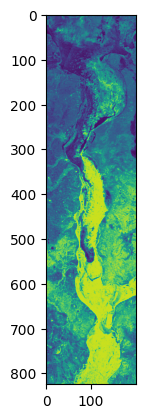

In [145]:
# Find images without black fragments
clear_radar_arr = np.empty((0, np.size(radar_arr,axis=1), np.size(radar_arr,axis=2)));
clear_radar_idx = []
#bug_radar_arr = np.empty((1, np.size(radar_arr,axis=1), np.size(radar_arr,axis=2)));
j = 0
for i in range(np.size(radar_arr, 0)):
    tmp = radar_arr[i, :, :]
    tmp = tmp[np.newaxis, :]
    if len(tmp[tmp<0.01]) <= 0.05*np.size(tmp, 0)*np.size(tmp, 1):
        clear_radar_arr = np.append(clear_radar_arr, tmp, axis=0)
        clear_radar_idx = np.append(clear_radar_idx,i)
    # else:
    #     bug_radar_arr = np.append(bug_radar_arr, tmp, axis=0)
    # print('i=', i)   
    
print(clear_radar_arr.shape)
plt.imshow(clear_radar_arr[112, :, :])
print(clear_radar_idx[:50])
print(clear_radar_idx[50:80])
print(clear_radar_idx[80:100])


In [46]:
def prepare_output(in_image):
    image_compressed = []
    image = deepcopy(in_image)
    min_dim = min((image.shape[0], image.shape[1]))
    image = image[:min_dim, :min_dim]
    im = Image.fromarray(image)
    im.thumbnail((128, 128))
    image_compressed.append(np.array(im))
    #image_compressed = np.transpose(image_compressed, axes=[1,2,0])
    return image_compressed

In [48]:
ground_arr = [];
for i in range(clear_radar_arr.shape[0]):
    #print('type i:', type(i))
    #print('type radar_arr:', type(radar_arr))
    image = clear_radar_arr[i,:,:]
    ground = prepare_output(image)
    ground_arr.append(ground) 
ground_arr = np.array(ground_arr)
ground_arr = np.squeeze(ground_arr)    
print(ground_arr.shape)

(113, 128, 128)


In [50]:
def get_bound_point(width, height):
    b = randint(1,4)
    if b==1:
        x = 0;
        y = randint(0, height)
    elif b==2:
        x = width
        y = randint(0, height)
    elif b==3:
        x = randint(0, width)
        y = 0
    elif b==4:
        x = randint(0, width)
        y = height       
    return x, y

In [51]:
def cut_image(in_imag):
    image = deepcopy(in_imag)
    width = np.size(image, 1)
    height = np.size(image, 1)
    x1, y1 = get_bound_point(width, height)
    x2, y2 = get_bound_point(width, height)
    while x1==x2 or y1==y2:
        x2, y2 = get_bound_point(width, height)
    
    flag = randint(0, 1) # flag on which side of line point
    for i in range(np.size(image,0)):
        for j in range(np.size(image,1)):
            d = (j - x1)*(y1-y2) - (i-y1)*(x2-x1)
            if (flag == 0  and d>0) or (flag == 1 and d<0):
                image[i, j] = 0.0
    #print('x1=', x1, 'y1=', y1)
    #print('x2=', x2, 'y2=', y2)
    return image
    

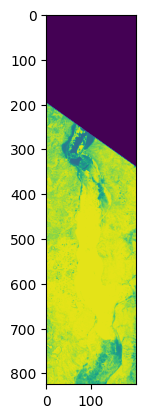

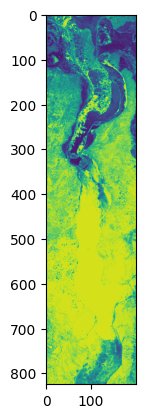

In [52]:
test_in = clear_radar_arr[50, :, :]
test_out = cut_image(test_in)
plt.figure()
plt.imshow(test_out)
plt.figure()
plt.imshow(test_in)

In [8]:
input_arr = []
for i in range(np.size(clear_radar_arr, 0)):
    tmp =  cut_image(clear_radar_arr[i,:,:])
    input_arr.append(tmp)
input_arr = np.array(input_arr)
print(input_arr.shape)

(113, 825, 200)


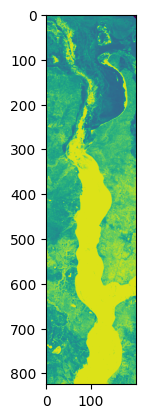

In [9]:
plt.figure()
plt.imshow(input_arr[29,:,:])

In [13]:
#np.save('input_arr', input_arr)

## COMPARING

In [83]:
x_arr_STpconv = np.load('preds/x_arr_STpconv.npy')
pred_arr_STpconv = np.load('preds/pred_arr_STpconv.npy')

In [58]:
x_arr_STpconv = np.array(x_arr_STpconv)
pred_arr_STpconv = np.array(pred_arr_STpconv)
print('shape x_arr_STpconv:', x_arr_STpconv.shape)
print('shape pred_arr_STpconv:', pred_arr_STpconv.shape)

shape x_arr_fno2d: (97, 128, 128)
shape pred_arr_fno2d: (97, 128, 128)
shape x_arr_STpconv: (97, 128, 128, 16)
shape pred_arr_STpconv: (97, 128, 128, 16)


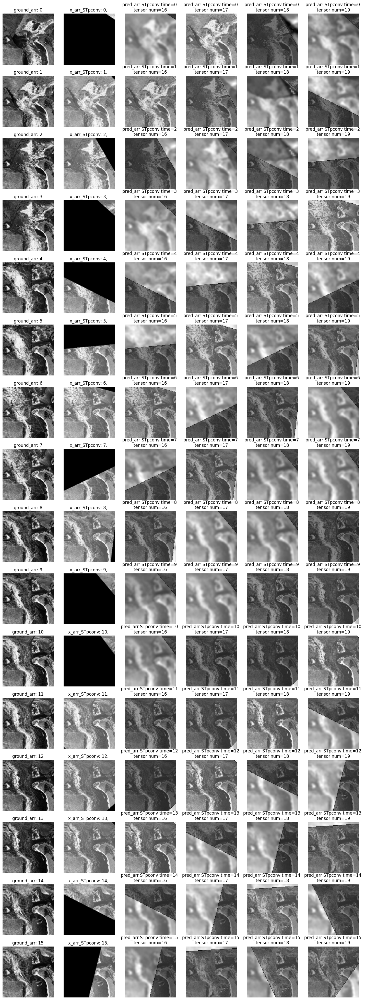

In [71]:
## Plot STPconvnet
rows = 16
columns = 6
t = 16
# create figure
fig = plt.figure(figsize=(18, 50))
#fig = plt.figure()

for i in range(rows):
    
    fig.add_subplot(rows, columns, i*columns+1)
    plt.imshow(np.squeeze(ground_arr[i+16,:,:]), cmap='gray')
    plt.axis('off')
    plt.title("ground_arr: %i" %i)
    
    fig.add_subplot(rows, columns, i*columns+2)
    plt.imshow(np.squeeze(x_arr_STpconv[t,:,:,i]),cmap='gray')
    plt.axis('off')
    plt.title("x_arr_STpconv: %i, " %i)
    
    fig.add_subplot(rows, columns, i*columns+3)
    plt.imshow(np.squeeze(pred_arr_STpconv[t,:,:,i]),cmap='gray')
    plt.axis('off')
    #plt.title("pred_arr_STpconv: %i, " %i )
    plt.title("pred_arr STpconv time={i} \ntensor num={t}".format(i=i, t=t))
    
    fig.add_subplot(rows, columns, i*columns+4)
    plt.imshow(np.squeeze(pred_arr_STpconv[t+1,:,:,i]),cmap='gray')
    plt.axis('off')
    plt.title("pred_arr STpconv time={i} \ntensor num={t}".format(i=i, t=t+1))
    
    fig.add_subplot(rows, columns, i*columns+5)
    plt.imshow(np.squeeze(pred_arr_STpconv[t+2,:,:,i]),cmap='gray')
    plt.axis('off')
    plt.title("pred_arr STpconv time={i} \ntensor num={t}".format(i=i, t=t+2))
    
    fig.add_subplot(rows, columns, i*columns+6)
    plt.imshow(np.squeeze(pred_arr_STpconv[t+3,:,:,i]),cmap='gray')
    plt.axis('off')
    plt.title("pred_arr STpconv time={i} \ntensor num={t}".format(i=i, t=t+3))

In [99]:
x_arr_fno2d_for = np.load('preds/x_arr_fno2d_forecast.npy')
pred_arr_fno2d_for = np.load('preds/pred_arr_fno2d_forecast.npy')
past_arr_fno2d_for = np.load('preds/past_arr_fno2d_forecast.npy')

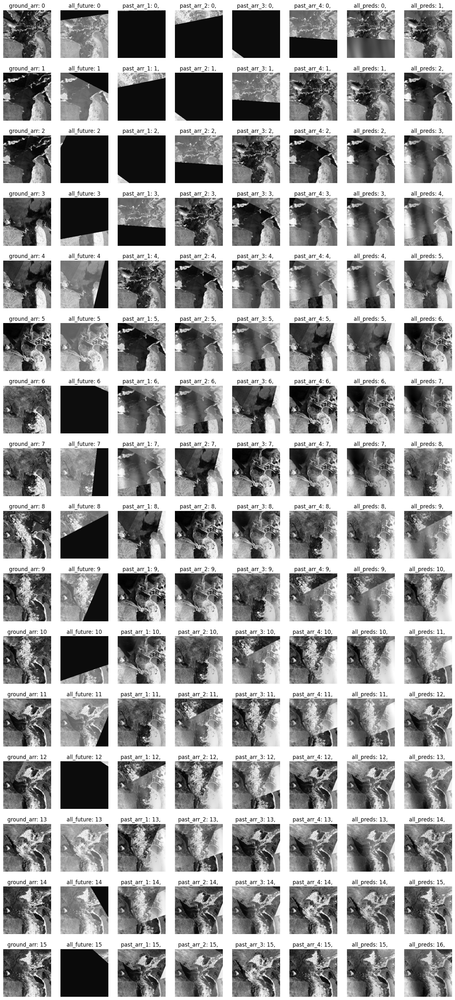

In [100]:
rows = 16
columns = 8
t = 1
# create figure
fig = plt.figure(figsize=(18, 40))
#fig = plt.figure()

for i in range(rows):
    
    fig.add_subplot(rows, columns, i*columns+1)
    plt.imshow(np.squeeze(ground_arr[i+4,:,:]), cmap='gray')
    plt.axis('off')
    plt.title("ground_arr: %i" %i)
    
    fig.add_subplot(rows, columns, i*columns+2)
    plt.imshow(np.squeeze(x_arr_fno2d_for[i,:,:]), cmap='gray')
    plt.axis('off')
    plt.title("all_future: %i" %i)
    
    fig.add_subplot(rows, columns, i*columns+3)
    plt.imshow(np.squeeze(past_arr_fno2d_for[i,0,:,:]),cmap='gray')
    plt.axis('off')
    plt.title("past_arr_1: %i, " %i)
    
    fig.add_subplot(rows, columns, i*columns+4)
    plt.imshow(np.squeeze(past_arr_fno2d_for[i,1,:,:]),cmap='gray')
    plt.axis('off')
    plt.title("past_arr_2: %i, " %i)
    
    fig.add_subplot(rows, columns, i*columns+5)
    plt.imshow(np.squeeze(past_arr_fno2d_for[i,2,:,:]),cmap='gray')
    plt.axis('off')
    plt.title("past_arr_3: %i, " %i)
    
    fig.add_subplot(rows, columns, i*columns+6)
    plt.imshow(np.squeeze(past_arr_fno2d_for[i,3,:,:]),cmap='gray')
    plt.axis('off')
    plt.title("past_arr_4: %i, " %i)

    
    fig.add_subplot(rows, columns, i*columns+7)
    plt.imshow(np.squeeze(pred_arr_fno2d_for[i,:,:]),cmap='gray')
    plt.axis('off')
    plt.title("all_preds: %i, " %i)
    
    fig.add_subplot(rows, columns, i*columns+8)
    plt.imshow(np.squeeze(pred_arr_fno2d_for[i+1,:,:]),cmap='gray')
    plt.axis('off')
    plt.title("all_preds: %i, " %(i+1))

In [101]:
x_arr_fno2d_pers = np.load('preds/x_arr_fno2d_persistance.npy')
pred_arr_fno2d_pers = np.load('preds/pred_arr_fno2d_persistance.npy')
past_arr_fno2d_pers = np.load('preds/past_arr_fno2d_persistance.npy')

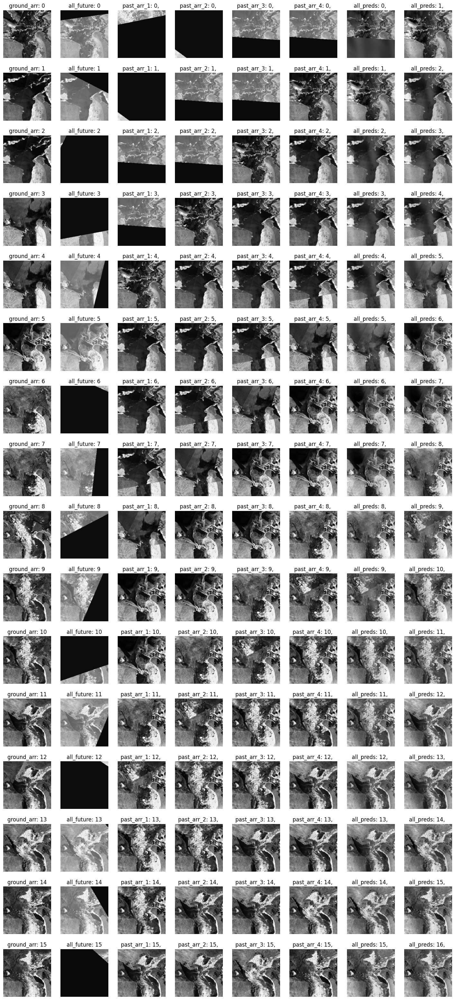

In [102]:
rows = 16
columns = 8
t = 1
# create figure
fig = plt.figure(figsize=(18, 40))
#fig = plt.figure()

for i in range(rows):
    
    fig.add_subplot(rows, columns, i*columns+1)
    plt.imshow(np.squeeze(ground_arr[i+4,:,:]), cmap='gray')
    plt.axis('off')
    plt.title("ground_arr: %i" %i)
    
    fig.add_subplot(rows, columns, i*columns+2)
    plt.imshow(np.squeeze(x_arr_fno2d_pers[i,:,:]), cmap='gray')
    plt.axis('off')
    plt.title("all_future: %i" %i)
    
    fig.add_subplot(rows, columns, i*columns+3)
    plt.imshow(np.squeeze(past_arr_fno2d_pers[i,0,:,:]),cmap='gray')
    plt.axis('off')
    plt.title("past_arr_1: %i, " %i)
    
    fig.add_subplot(rows, columns, i*columns+4)
    plt.imshow(np.squeeze(past_arr_fno2d_pers[i,1,:,:]),cmap='gray')
    plt.axis('off')
    plt.title("past_arr_2: %i, " %i)
    
    fig.add_subplot(rows, columns, i*columns+5)
    plt.imshow(np.squeeze(past_arr_fno2d_pers[i,2,:,:]),cmap='gray')
    plt.axis('off')
    plt.title("past_arr_3: %i, " %i)
    
    fig.add_subplot(rows, columns, i*columns+6)
    plt.imshow(np.squeeze(past_arr_fno2d_pers[i,3,:,:]),cmap='gray')
    plt.axis('off')
    plt.title("past_arr_4: %i, " %i)

    
    fig.add_subplot(rows, columns, i*columns+7)
    plt.imshow(np.squeeze(pred_arr_fno2d_pers[i,:,:]),cmap='gray')
    plt.axis('off')
    plt.title("all_preds: %i, " %i)
    
    fig.add_subplot(rows, columns, i*columns+8)
    plt.imshow(np.squeeze(pred_arr_fno2d_pers[i+1,:,:]),cmap='gray')
    plt.axis('off')
    plt.title("all_preds: %i, " %(i+1))

In [72]:
# rows = 16
# columns = 7
# t = 16
# # create figure
# fig = plt.figure(figsize=(18, 32))
# #fig = plt.figure()

# for i in range(rows):
    
#     fig.add_subplot(rows, columns, i*columns+1)
#     plt.imshow(np.squeeze(ground_arr[i+16,:,:]), cmap='gray')
#     plt.axis('off')
#     plt.title("ground_arr: %i" %i)
    
#     fig.add_subplot(rows, columns, i*columns+2)
#     plt.imshow(np.squeeze(x_arr_fno2d[i,:,:]), cmap='gray')
#     plt.axis('off')
#     plt.title("x_arr_fno2d: %i" %i)
    
#     fig.add_subplot(rows, columns, i*columns+3)
#     plt.imshow(np.squeeze(pred_arr_fno2d[i,:,:]), cmap='gray')
#     plt.axis('off')
#     plt.title("pred_arr_fno2d: %i" %i)
    
    
#     fig.add_subplot(rows, columns, i*columns+4)
#     plt.imshow(np.squeeze(x_arr_STpconv[t,:,:,i]),cmap='gray')
#     plt.axis('off')
#     plt.title("x_arr_STpconv: %i, " %i)
    
#     fig.add_subplot(rows, columns, i*columns+5)
#     plt.imshow(np.squeeze(pred_arr_STpconv[t,:,:,i]),cmap='gray')
#     plt.axis('off')
#     plt.title("pred_arr_STpconv: %i, " %i )
    
#     fig.add_subplot(rows, columns, i*columns+6)
#     plt.imshow(np.squeeze(x_arr_STpconv[t+1,:,:,i]),cmap='gray')
#     plt.axis('off')
#     plt.title("x_arr_STpconv: %i, " %i )
    
#     fig.add_subplot(rows, columns, i*columns+7)
#     plt.imshow(np.squeeze(pred_arr_STpconv[t+1,:,:,i]),cmap='gray')
#     plt.axis('off')
#     plt.title("pred_arr_STpconv: %i, " %i )    

In [103]:
def calculateMAE(a, b):
    return np.sum(np.absolute(a - b))/a.size

In [121]:
def calculateRMSE(a,b):
    return np.sqrt(np.mean((a-b)**2))

In [104]:
print(pred_arr_STpconv.shape)

(97, 128, 128, 16)


## STpconv MAE

In [105]:
tmp_STpconv_arr=[]
tmp_pers_arr=[]
for i in  range(pred_arr_STpconv.shape[0]):
    for j in range(2, pred_arr_STpconv.shape[3]):
        tmp_STpconv=calculateMAE(pred_arr_STpconv[i,:,:,j], ground_arr[i+j,:,:])
        tmp_STpconv_arr.append(tmp_STpconv)
        tmp_pers=calculateMAE(ground_arr[i+j-1,:,:], ground_arr[i+j,:,:])
        tmp_pers_arr.append(tmp_pers)
tmp_STpconv_arr = np.array(tmp_STpconv_arr)
tmp_STpconv_arr = np.squeeze(tmp_STpconv_arr)
tmp_pers_arr = np.array(tmp_pers_arr)
tmp_STpconv_arr = np.squeeze(tmp_STpconv_arr)

print(tmp_STpconv_arr.shape)
print(tmp_pers_arr.shape)

(1358,)
(1358,)


In [106]:
mae_tmp_STpconv= np.mean(tmp_STpconv_arr)
mae_tmp_pers= np.mean(tmp_pers_arr)

print(mae_tmp_STpconv)
print(mae_tmp_pers)

0.24908762016476593
0.0587429665039336


## STpconv RMSE

In [122]:
tmp_STpconv_arr=[]
tmp_pers_arr=[]
for i in  range(pred_arr_STpconv.shape[0]):
    for j in range(2, pred_arr_STpconv.shape[3]):
        tmp_STpconv=calculateRMSE(pred_arr_STpconv[i,:,:,j], ground_arr[i+j,:,:])
        tmp_STpconv_arr.append(tmp_STpconv)
        tmp_pers=calculateRMSE(ground_arr[i+j-1,:,:], ground_arr[i+j,:,:])
        tmp_pers_arr.append(tmp_pers)
tmp_STpconv_arr = np.array(tmp_STpconv_arr)
tmp_STpconv_arr = np.squeeze(tmp_STpconv_arr)
tmp_pers_arr = np.array(tmp_pers_arr)
tmp_STpconv_arr = np.squeeze(tmp_STpconv_arr)

print(tmp_STpconv_arr.shape)
print(tmp_pers_arr.shape)

(1358,)
(1358,)


In [123]:
RMSE_tmp_STpconv= np.mean(tmp_STpconv_arr)
RMSE_tmp_pers= np.mean(tmp_pers_arr)

print(RMSE_tmp_STpconv)
print(RMSE_tmp_pers)

0.3404401561609118
0.091868974


## FNO2D MAE

In [108]:
print(pred_arr_fno2d_for.shape)

(109, 128, 128)


In [109]:
tmp_fno2d_for_arr=[]
tmp_pers_arr=[]
for i in  range(pred_arr_fno2d_for.shape[0]):
    tmp_fno2d_for=calculateMAE(pred_arr_fno2d_for[i,:,:], ground_arr[i+4,:,:])
    tmp_fno2d_for_arr.append(tmp_fno2d_for)
    tmp_pers=calculateMAE(ground_arr[i+4-1,:,:], ground_arr[i+4,:,:])
    tmp_pers_arr.append(tmp_pers)
tmp_fno2d_for_arr = np.array(tmp_fno2d_for_arr)
tmp_fno2d_for_arr = np.squeeze(tmp_fno2d_for_arr)
tmp_pers_arr = np.array(tmp_pers_arr)
tmp_pers_arr = np.squeeze(tmp_pers_arr)

print(tmp_fno2d_for_arr.shape)
print(tmp_pers_arr.shape)

(109,)
(109,)


In [112]:
mae_tmp_fno2d_for= np.mean(tmp_fno2d_for_arr)
mae_tmp_pers= np.mean(tmp_pers_arr)

print(mae_tmp_fno2d_for)
print(mae_tmp_pers)

0.16310190197524674
0.06231514003486672


In [115]:
print(pred_arr_fno2d_pers.shape)

(109, 128, 128)


In [116]:
tmp_fno2d_pers_arr=[]
tmp_pers_arr=[]
for i in  range(pred_arr_fno2d_pers.shape[0]):
    tmp_fno2d_pers=calculateMAE(pred_arr_fno2d_pers[i,:,:], ground_arr[i+4,:,:])
    tmp_fno2d_pers_arr.append(tmp_fno2d_pers)
    tmp_pers=calculateMAE(ground_arr[i+4-1,:,:], ground_arr[i+4,:,:])
    tmp_pers_arr.append(tmp_pers)
tmp_fno2d_pers_arr = np.array(tmp_fno2d_pers_arr)
tmp_fno2d_pers_arr = np.squeeze(tmp_fno2d_pers_arr)
tmp_pers_arr = np.array(tmp_pers_arr)
tmp_pers_arr = np.squeeze(tmp_pers_arr)

print(tmp_fno2d_pers_arr.shape)
print(tmp_pers_arr.shape)

(109,)
(109,)


In [117]:
mae_tmp_fno2d_pers= np.mean(tmp_fno2d_pers_arr)
mae_tmp_pers= np.mean(tmp_pers_arr)

print(mae_tmp_fno2d_pers)
print(mae_tmp_pers)

0.12676705194449206
0.06231514003486672


## FNO2D MAE v2

In [131]:
x_arr_fno2d_for = np.load('preds/x_arr_fno2d_forecast_2.npy')
pred_arr_fno2d_for = np.load('preds/pred_arr_fno2d_forecast_2.npy')
past_arr_fno2d_for = np.load('preds/past_arr_fno2d_forecast_2.npy')

In [132]:
tmp_fno2d_for_arr=[]
tmp_pers_arr=[]
for i in  range(pred_arr_fno2d_for.shape[0]):
    tmp_fno2d_for=calculateMAE(pred_arr_fno2d_for[i,:,:], ground_arr[i+4,:,:])
    tmp_fno2d_for_arr.append(tmp_fno2d_for)
    tmp_pers=calculateMAE(ground_arr[i+4-1,:,:], ground_arr[i+4,:,:])
    tmp_pers_arr.append(tmp_pers)
tmp_fno2d_for_arr = np.array(tmp_fno2d_for_arr)
tmp_fno2d_for_arr = np.squeeze(tmp_fno2d_for_arr)
tmp_pers_arr = np.array(tmp_pers_arr)
tmp_pers_arr = np.squeeze(tmp_pers_arr)

print(tmp_fno2d_for_arr.shape)
print(tmp_pers_arr.shape)

(109,)
(109,)


In [133]:
mae_tmp_fno2d_for= np.mean(tmp_fno2d_for_arr)
mae_tmp_pers= np.mean(tmp_pers_arr)

print(mae_tmp_fno2d_for)
print(mae_tmp_pers)

0.13381504240112568
0.06231514003486672


In [128]:
x_arr_fno2d_pers = np.load('preds/x_arr_fno2d_persistance_2.npy')
pred_arr_fno2d_pers = np.load('preds/pred_arr_fno2d_persistance_2.npy')
past_arr_fno2d_pers = np.load('preds/past_arr_fno2d_persistance_2.npy')

In [129]:
tmp_fno2d_pers_arr=[]
tmp_pers_arr=[]
for i in  range(pred_arr_fno2d_pers.shape[0]):
    tmp_fno2d_pers=calculateMAE(pred_arr_fno2d_pers[i,:,:], ground_arr[i+4,:,:])
    tmp_fno2d_pers_arr.append(tmp_fno2d_pers)
    tmp_pers=calculateMAE(ground_arr[i+4-1,:,:], ground_arr[i+4,:,:])
    tmp_pers_arr.append(tmp_pers)
tmp_fno2d_pers_arr = np.array(tmp_fno2d_pers_arr)
tmp_fno2d_pers_arr = np.squeeze(tmp_fno2d_pers_arr)
tmp_pers_arr = np.array(tmp_pers_arr)
tmp_pers_arr = np.squeeze(tmp_pers_arr)

print(tmp_fno2d_pers_arr.shape)
print(tmp_pers_arr.shape)

(109,)
(109,)


In [130]:
mae_tmp_fno2d_pers= np.mean(tmp_fno2d_pers_arr)
mae_tmp_pers= np.mean(tmp_pers_arr)

print(mae_tmp_fno2d_pers)
print(mae_tmp_pers)

0.09494513030582612
0.06231514003486672


## FNO2D RMSE

In [124]:
tmp_fno2d_for_arr=[]
tmp_pers_arr=[]
for i in  range(pred_arr_fno2d_for.shape[0]):
    tmp_fno2d_for=calculateRMSE(pred_arr_fno2d_for[i,:,:], ground_arr[i+4,:,:])
    tmp_fno2d_for_arr.append(tmp_fno2d_for)
    tmp_pers=calculateRMSE(ground_arr[i+4-1,:,:], ground_arr[i+4,:,:])
    tmp_pers_arr.append(tmp_pers)
tmp_fno2d_for_arr = np.array(tmp_fno2d_for_arr)
tmp_fno2d_for_arr = np.squeeze(tmp_fno2d_for_arr)
tmp_pers_arr = np.array(tmp_pers_arr)
tmp_pers_arr = np.squeeze(tmp_pers_arr)

print(tmp_fno2d_for_arr.shape)
print(tmp_pers_arr.shape)

(109,)
(109,)


In [125]:
rmse_tmp_fno2d_for= np.mean(tmp_fno2d_for_arr)
rmse_tmp_pers= np.mean(tmp_pers_arr)

print(rmse_tmp_fno2d_for)
print(rmse_tmp_pers)

0.19554614
0.09601636


In [126]:
tmp_fno2d_pers_arr=[]
tmp_pers_arr=[]
for i in  range(pred_arr_fno2d_pers.shape[0]):
    tmp_fno2d_pers=calculateRMSE(pred_arr_fno2d_pers[i,:,:], ground_arr[i+4,:,:])
    tmp_fno2d_pers_arr.append(tmp_fno2d_pers)
    tmp_pers=calculateRMSE(ground_arr[i+4-1,:,:], ground_arr[i+4,:,:])
    tmp_pers_arr.append(tmp_pers)
tmp_fno2d_pers_arr = np.array(tmp_fno2d_pers_arr)
tmp_fno2d_pers_arr = np.squeeze(tmp_fno2d_pers_arr)
tmp_pers_arr = np.array(tmp_pers_arr)
tmp_pers_arr = np.squeeze(tmp_pers_arr)

print(tmp_fno2d_pers_arr.shape)
print(tmp_pers_arr.shape)

(109,)
(109,)


In [127]:
rmse_tmp_fno2d_pers= np.mean(tmp_fno2d_pers_arr)
rmse_tmp_pers= np.mean(tmp_pers_arr)

print(rmse_tmp_fno2d_pers)
print(rmse_tmp_pers)

0.15617444
0.09601636


## FNO2D RMSE v2

In [134]:
x_arr_fno2d_for = np.load('preds/x_arr_fno2d_forecast_2.npy')
pred_arr_fno2d_for = np.load('preds/pred_arr_fno2d_forecast_2.npy')
past_arr_fno2d_for = np.load('preds/past_arr_fno2d_forecast_2.npy')

In [135]:
tmp_fno2d_for_arr=[]
tmp_pers_arr=[]
for i in  range(pred_arr_fno2d_for.shape[0]):
    tmp_fno2d_for=calculateRMSE(pred_arr_fno2d_for[i,:,:], ground_arr[i+4,:,:])
    tmp_fno2d_for_arr.append(tmp_fno2d_for)
    tmp_pers=calculateRMSE(ground_arr[i+4-1,:,:], ground_arr[i+4,:,:])
    tmp_pers_arr.append(tmp_pers)
tmp_fno2d_for_arr = np.array(tmp_fno2d_for_arr)
tmp_fno2d_for_arr = np.squeeze(tmp_fno2d_for_arr)
tmp_pers_arr = np.array(tmp_pers_arr)
tmp_pers_arr = np.squeeze(tmp_pers_arr)

print(tmp_fno2d_for_arr.shape)
print(tmp_pers_arr.shape)

(109,)
(109,)


In [136]:
rmse_tmp_fno2d_for= np.mean(tmp_fno2d_for_arr)
rmse_tmp_pers= np.mean(tmp_pers_arr)

print(rmse_tmp_fno2d_for)
print(rmse_tmp_pers)

0.15926468
0.09601636


In [137]:
x_arr_fno2d_pers = np.load('preds/x_arr_fno2d_persistance_2.npy')
pred_arr_fno2d_pers = np.load('preds/pred_arr_fno2d_persistance_2.npy')
past_arr_fno2d_pers = np.load('preds/past_arr_fno2d_persistance_2.npy')

In [138]:
tmp_fno2d_pers_arr=[]
tmp_pers_arr=[]
for i in  range(pred_arr_fno2d_pers.shape[0]):
    tmp_fno2d_pers=calculateRMSE(pred_arr_fno2d_pers[i,:,:], ground_arr[i+4,:,:])
    tmp_fno2d_pers_arr.append(tmp_fno2d_pers)
    tmp_pers=calculateRMSE(ground_arr[i+4-1,:,:], ground_arr[i+4,:,:])
    tmp_pers_arr.append(tmp_pers)
tmp_fno2d_pers_arr = np.array(tmp_fno2d_pers_arr)
tmp_fno2d_pers_arr = np.squeeze(tmp_fno2d_pers_arr)
tmp_pers_arr = np.array(tmp_pers_arr)
tmp_pers_arr = np.squeeze(tmp_pers_arr)

print(tmp_fno2d_pers_arr.shape)
print(tmp_pers_arr.shape)

(109,)
(109,)


In [139]:
rmse_tmp_fno2d_pers= np.mean(tmp_fno2d_pers_arr)
rmse_tmp_pers= np.mean(tmp_pers_arr)

print(rmse_tmp_fno2d_pers)
print(rmse_tmp_pers)

0.12301218
0.09601636
